In [1]:
import meds
import fitsio
import proplot as pplt
import subprocess
import glob
import os
import numpy as np


In [2]:
def _download_tile(tilename, cwd):
    os.system("mkdir -p data")

    d = fitsio.read(
        os.path.join(cwd, "fnames.fits"),
        lower=True,
    )
    tnames = np.array([
        d["filename"][i].split("_")[0]
        for i in range(d.shape[0])
    ])
    msk = tnames == tilename
    if np.sum(msk) != 4:
        return np.sum(msk)

    d = d[msk]
    mfiles = []
    for band in ["g", "r", "i", "z"]:
        msk = d["band"] == band
        if np.any(msk):
            _d = d[msk]
            for i in range(len(_d)):
                fname = os.path.join(d["path"][msk][i], d["filename"][msk][i])
                cmd = """\
        rsync \
                -av \
                --password-file $DES_RSYNC_PASSFILE \
                ${DESREMOTE_RSYNC_USER}@${DESREMOTE_RSYNC}/%s \
                ./data/%s
        """ % (fname, os.path.basename(fname))
                subprocess.run(cmd, shell=True, check=True)
            mfiles.append("./data/%s" % os.path.basename(fname))

    return mfiles


In [3]:
fnames = sorted(glob.glob("./data_final_nogcut/*.fits"))

In [4]:
find = 10
tilename = os.path.basename(fnames[find]).split("_")[0]
mfiles = _download_tile(tilename, ".")


    DES rsync daemon

receiving incremental file list
DES0000-3706_r5763p01_g_pizza-cutter-slices.fits.fz

sent 42 bytes  received 906747535 bytes  86356912.10 bytes/sec
total size is 906526080  speedup is 1.00

    DES rsync daemon

receiving incremental file list
DES0000-3706_r5763p01_r_pizza-cutter-slices.fits.fz

sent 42 bytes  received 886035287 bytes  84384317.05 bytes/sec
total size is 885818880  speedup is 1.00

    DES rsync daemon

receiving incremental file list
DES0000-3706_r5763p01_i_pizza-cutter-slices.fits.fz

sent 42 bytes  received 891070751 bytes  93796925.58 bytes/sec
total size is 890853120  speedup is 1.00

    DES rsync daemon

receiving incremental file list
DES0000-3706_r5763p01_z_pizza-cutter-slices.fits.fz

sent 42 bytes  received 898209135 bytes  85543731.14 bytes/sec
total size is 897989760  speedup is 1.00


In [5]:
try:
    m.close()
except Exception:
    pass
m = meds.MEDS(mfiles[2])

In [6]:
d = fitsio.read(fnames[find])

In [28]:
# compute mags - some will be nan
mag_g = 30.0 - 2.5*np.log10(d["mdet_g_flux"])
mag_r = 30.0 - 2.5*np.log10(d["mdet_r_flux"])
mag_i = 30.0 - 2.5*np.log10(d["mdet_i_flux"])
mag_z = 30.0 - 2.5*np.log10(d["mdet_z_flux"])
gmr = mag_g - mag_r
rmi = mag_r - mag_i
imz = mag_i - mag_z

msk = (
    (d["flags"] == 0) 
    & (d["mask_flags"] == 0)
    & (d["mdet_flux_flags"] == 0)
    & (d["mdet_T_ratio"] > 0.5)
    & (d["mdet_s2n"] > 10)
    & (d["mfrac"] < 0.05)
    & (d["mdet_T"] >= 1.9 - 2.8*d["mdet_T_err"])
    & (np.abs(gmr) < 5)
    & (np.abs(rmi) < 5)
    & (np.abs(imz) < 5)
    & np.isfinite(mag_g)
    & np.isfinite(mag_r)
    & np.isfinite(mag_i)
    & np.isfinite(mag_z)
    & (mag_g < 26.5)
    & (mag_r < 26.5)
    & (mag_i < 26.2)
    & (mag_z < 25.6)
    & (d["mdet_step"] == "noshear")
)

dsel = d[msk]
np.sum(msk)

/gpfs02/astro/workarea/beckermr/tmp/ipykernel_8842/2729917384.py:2: RuntimeWarning: invalid value encountered in log10
  mag_g = 30.0 - 2.5*np.log10(d["mdet_g_flux"])
/gpfs02/astro/workarea/beckermr/tmp/ipykernel_8842/2729917384.py:3: RuntimeWarning: invalid value encountered in log10
  mag_r = 30.0 - 2.5*np.log10(d["mdet_r_flux"])
/gpfs02/astro/workarea/beckermr/tmp/ipykernel_8842/2729917384.py:4: RuntimeWarning: invalid value encountered in log10
  mag_i = 30.0 - 2.5*np.log10(d["mdet_i_flux"])
/gpfs02/astro/workarea/beckermr/tmp/ipykernel_8842/2729917384.py:5: RuntimeWarning: invalid value encountered in log10
  mag_z = 30.0 - 2.5*np.log10(d["mdet_z_flux"])


206

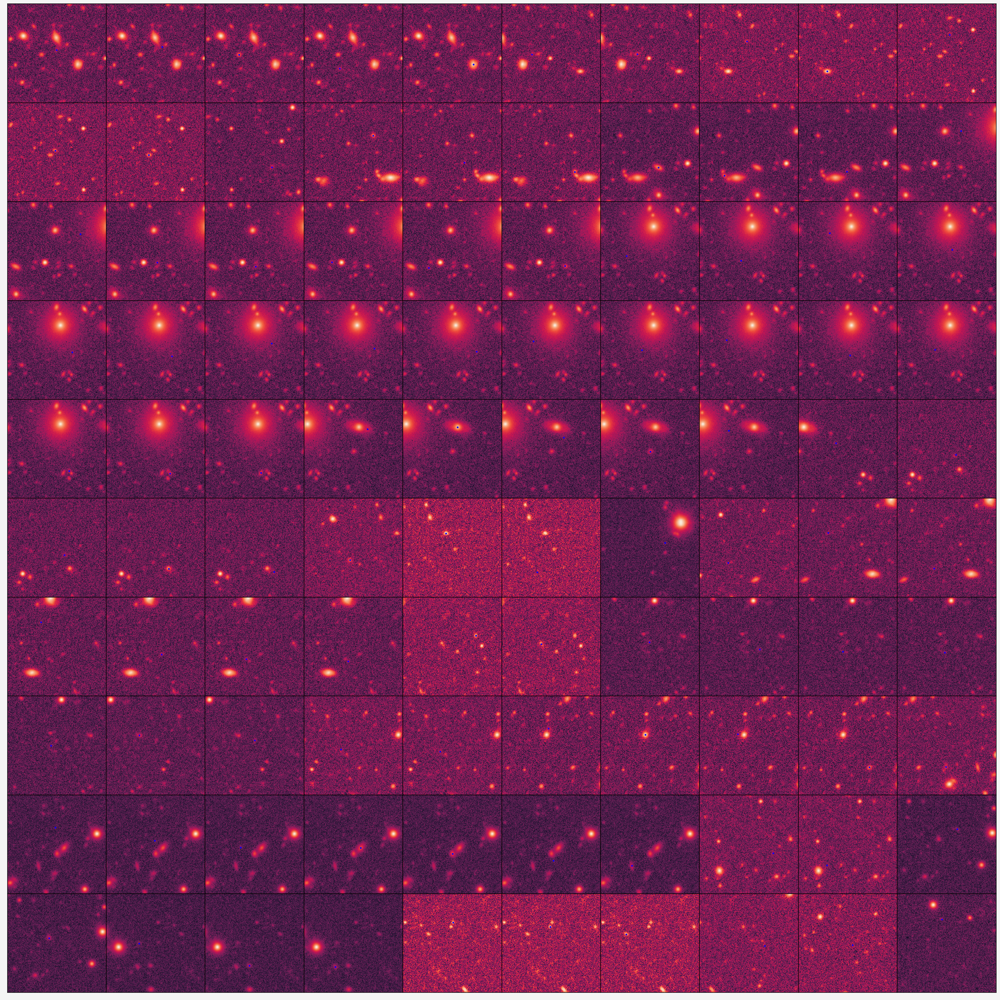

In [32]:
dim = 10
fig, axs = pplt.subplots(nrows=dim, ncols=dim, figsize=(16, 16), hspace=0, wspace=0, share=0)

i = 200
for _i in range(dim):
    for _j in range(dim):
        sid = dsel["slice_id"][i]
        im = m.get_cutout(sid, 0)
        wgt = m.get_cutout(sid, 0, type="weight")
        axs[_i, _j].imshow(np.arcsinh(im * np.sqrt(np.median(wgt))), cmap="rocket")
        axs[_i, _j].plot(dsel["slice_x"][i], dsel["slice_y"][i], "b.", ms=2)
        # print(dsel["mdet_s2n"][i])
        axs[_i, _j].grid(False)
        axs[_i, _j].xaxis.set_visible(False)
        axs[_i, _j].yaxis.set_visible(False)
        i += 1
        
fig.savefig("big_junk.png", dpi=100)

In [31]:
# compute mags - some will be nan
mag_g = 30.0 - 2.5*np.log10(d["mdet_g_flux"])
mag_r = 30.0 - 2.5*np.log10(d["mdet_r_flux"])
mag_i = 30.0 - 2.5*np.log10(d["mdet_i_flux"])
mag_z = 30.0 - 2.5*np.log10(d["mdet_z_flux"])
gmr = mag_g - mag_r
rmi = mag_r - mag_i
imz = mag_i - mag_z

msk = (
    (d["flags"] == 0) 
    & (d["mask_flags"] == 0)
    & (d["mdet_flux_flags"] == 0)
    & (d["mdet_T_ratio"] > 0.5)
    & (d["mdet_s2n"] > 10)
    & (d["mfrac"] < 0.02)
    & (d["mdet_T"] < 1.9 - 2.8*d["mdet_T_err"])
    & (np.abs(gmr) < 5)
    & (np.abs(rmi) < 5)
    & (np.abs(imz) < 5)
    & np.isfinite(mag_g)
    & np.isfinite(mag_r)
    & np.isfinite(mag_i)
    & np.isfinite(mag_z)
    & (mag_g < 26.5)
    & (mag_r < 26.5)
    & (mag_i < 26.2)
    & (mag_z < 25.6)
    & (d["mdet_step"] == "noshear")
)

dsel = d[msk]
print(np.sum(msk)*1e4/1e6)

/gpfs02/astro/workarea/beckermr/tmp/ipykernel_8842/2410659191.py:2: RuntimeWarning: invalid value encountered in log10
  mag_g = 30.0 - 2.5*np.log10(d["mdet_g_flux"])
/gpfs02/astro/workarea/beckermr/tmp/ipykernel_8842/2410659191.py:3: RuntimeWarning: invalid value encountered in log10
  mag_r = 30.0 - 2.5*np.log10(d["mdet_r_flux"])
/gpfs02/astro/workarea/beckermr/tmp/ipykernel_8842/2410659191.py:4: RuntimeWarning: invalid value encountered in log10
  mag_i = 30.0 - 2.5*np.log10(d["mdet_i_flux"])
/gpfs02/astro/workarea/beckermr/tmp/ipykernel_8842/2410659191.py:5: RuntimeWarning: invalid value encountered in log10
  mag_z = 30.0 - 2.5*np.log10(d["mdet_z_flux"])


220.05
